In [3]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/railway-track-fault-detection/Railway Track fault Detection Updated/Validation/Defective/IMG_20201211_121249.jpg
/kaggle/input/railway-track-fault-detection/Railway Track fault Detection Updated/Validation/Defective/IMG_20201211_121703.jpg
/kaggle/input/railway-track-fault-detection/Railway Track fault Detection Updated/Validation/Defective/IMG_20201211_121541.jpg
/kaggle/input/railway-track-fault-detection/Railway Track fault Detection Updated/Validation/Defective/IMG_20201114_102932.jpg
/kaggle/input/railway-track-fault-detection/Railway Track fault Detection Updated/Validation/Defective/IMG_20201114_102159.jpg
/kaggle/input/railway-track-fault-detection/Railway Track fault Detection Updated/Validation/Defective/IMG_20201211_121524.jpg
/kaggle/input/railway-track-fault-detection/Railway Track fault Detection Updated/Validation/Defective/IMG_20201211_121655.jpg
/kaggle/input/railway-track-fault-detection/Railway Track fault Detection Updated/Validation/Defective/IMG_2020

**Preprocessing steps**
1. Denoising original images
2. Normalizing
3. Augmentation
4. Apply edge detection, morphological operations, histogram equalization, and contour detection.

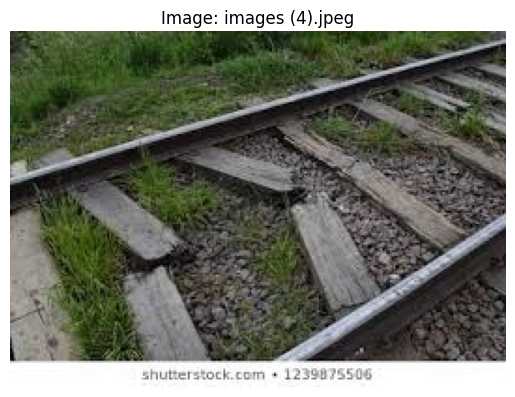

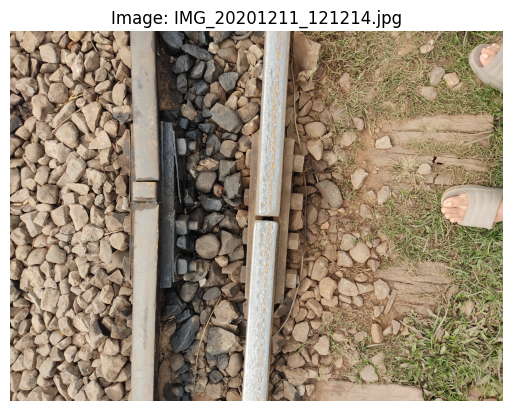

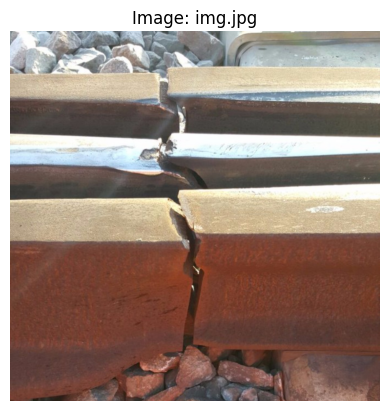

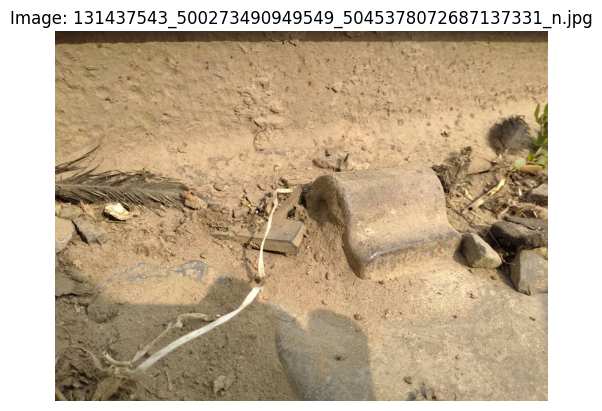

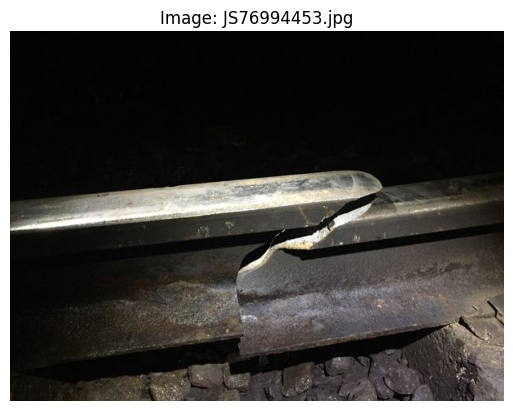

In [4]:
import os
import cv2
import matplotlib.pyplot as plt
dataset_path = "/kaggle/input/railway-track-fault-detection/Railway Track fault Detection Updated/Train/Defective"
image_files = [file for file in os.listdir(dataset_path) if file.endswith(('.png', '.jpg', '.jpeg'))]

# Display a few images
for img_file in image_files[:5]:  # Show first 5 images
    img_path = os.path.join(dataset_path, img_file)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for correct display
    plt.imshow(img)
    plt.title(f"Image: {img_file}")
    plt.axis('off')
    plt.show()


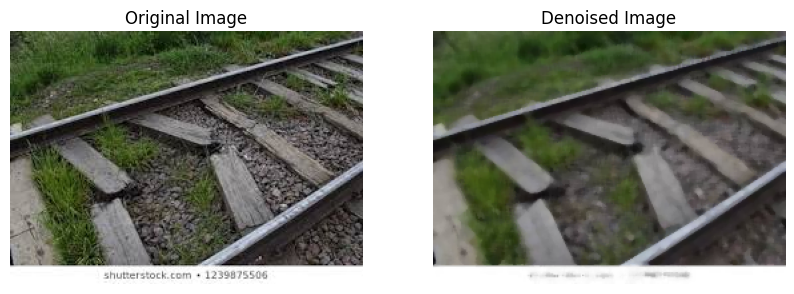

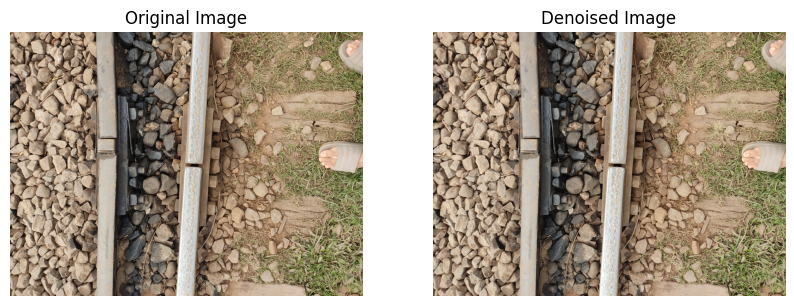

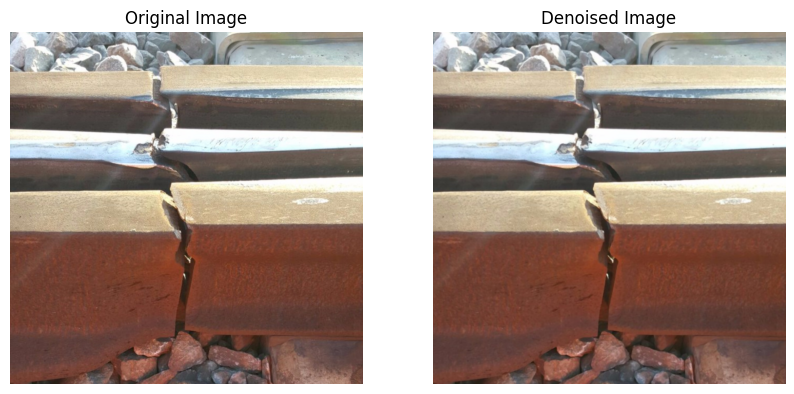

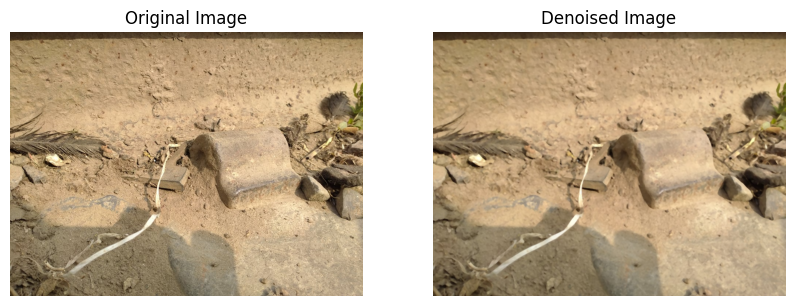

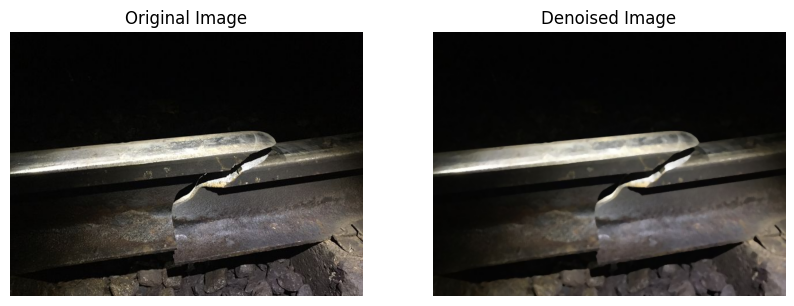

In [5]:
import os
import cv2
import matplotlib.pyplot as plt

# Dataset path
dataset_path = "/kaggle/input/railway-track-fault-detection/Railway Track fault Detection Updated/Train/Defective"

# Create a directory to save denoised images
output_path = "/kaggle/working/Defective_Denoised"
os.makedirs(output_path, exist_ok=True)

# List all image files
image_files = [file for file in os.listdir(dataset_path) if file.endswith(('.png', '.jpg', '.jpeg'))]

# Apply noise removal and save images
for img_file in image_files:
    img_path = os.path.join(dataset_path, img_file)
    img = cv2.imread(img_path)

    # Apply Median Blur for noise removal
    denoised_img = cv2.medianBlur(img, 5)  # Kernel size 5

    # Save denoised image
    cv2.imwrite(os.path.join(output_path, img_file), denoised_img)

    # Display original and denoised images (for the first 3 images)
    if image_files.index(img_file) < 5:
        plt.figure(figsize=(10, 5))

        # Original image
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title("Original Image")
        plt.axis('off')

        # Denoised image
        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(denoised_img, cv2.COLOR_BGR2RGB))
        plt.title("Denoised Image")
        plt.axis('off')

        plt.show()



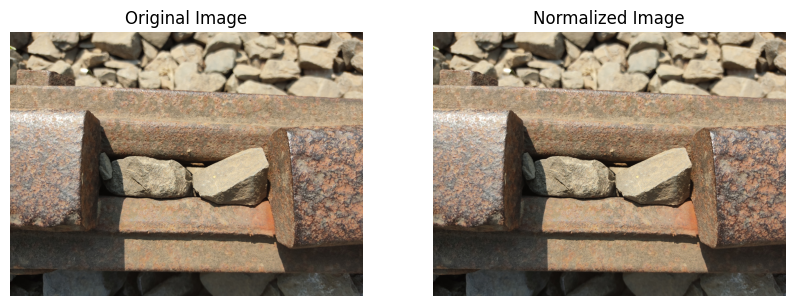

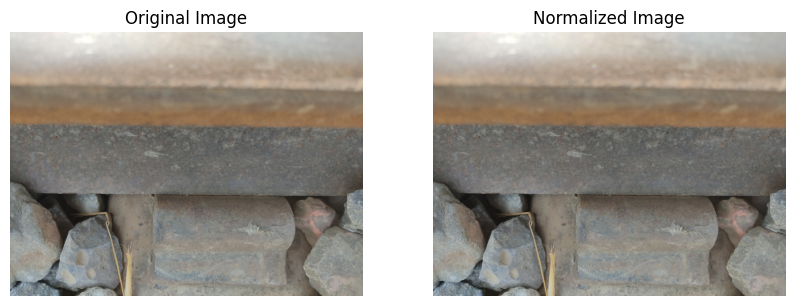

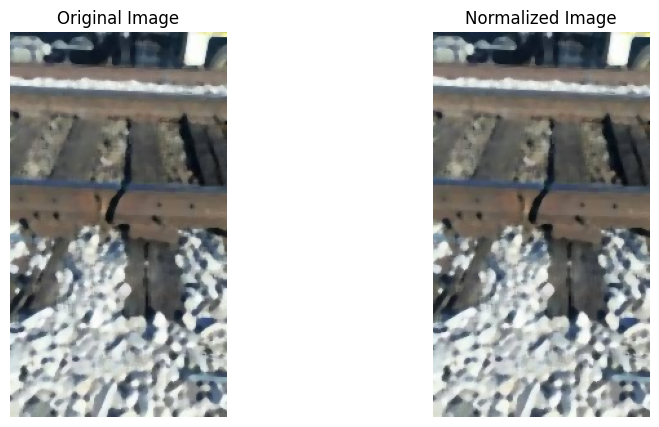

In [6]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Dataset path
dataset_path = "/kaggle/working/Defective_Denoised"

# Create a directory to save normalized images
output_path = "/kaggle/working/Defective_Normalized"
os.makedirs(output_path, exist_ok=True)

# List all image files
image_files = [file for file in os.listdir(dataset_path) if file.endswith(('.png', '.jpg', '.jpeg'))]

# Apply normalization and save images
for img_file in image_files:
    img_path = os.path.join(dataset_path, img_file)
    img = cv2.imread(img_path)

    # Convert image to float and normalize to [0, 1]
    normalized_img = img / 255.0

    # Convert back to uint8 for saving (optional)
    img_to_save = (normalized_img * 255).astype(np.uint8)

    # Save normalized image
    cv2.imwrite(os.path.join(output_path, img_file), img_to_save)

    # Display original and normalized images (for the first 3 images)
    if image_files.index(img_file) < 3:
        plt.figure(figsize=(10, 5))

        # Original image
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title("Original Image")
        plt.axis('off')

        # Normalized image
        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(img_to_save, cv2.COLOR_BGR2RGB))
        plt.title("Normalized Image")
        plt.axis('off')

        plt.show()


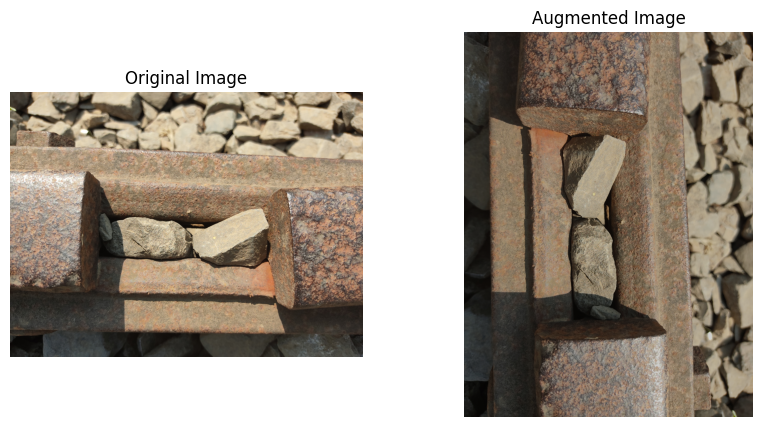

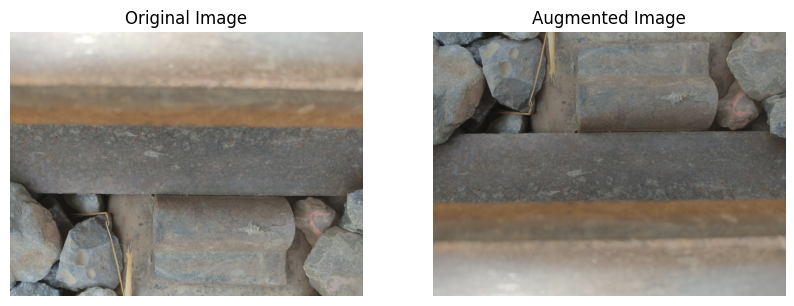

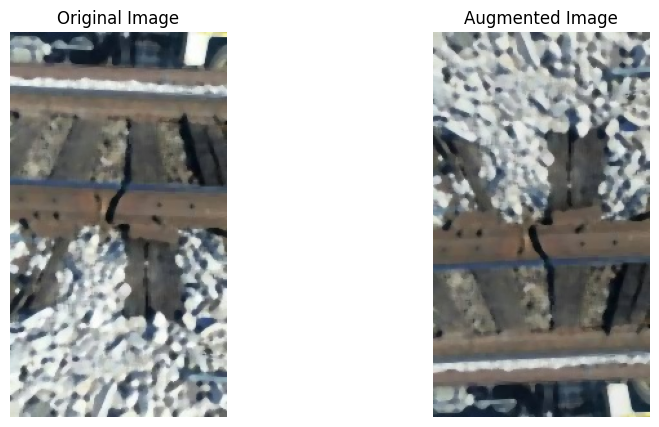

In [7]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random

# Dataset path
dataset_path = "/kaggle/working/Defective_Denoised"

# Create a directory to save augmented images
augmented_path = "/kaggle/working/Defective_Augmented"
os.makedirs(augmented_path, exist_ok=True)

# List all image files
image_files = [file for file in os.listdir(dataset_path) if file.endswith(('.png', '.jpg', '.jpeg'))]

def augment_image(img):
    """Apply random augmentation techniques."""
    # Random rotation
    angle = random.choice([0, 90, 180, 270])
    rotated_img = cv2.rotate(img, {0: cv2.ROTATE_90_CLOCKWISE, 90: cv2.ROTATE_180, 180: cv2.ROTATE_90_COUNTERCLOCKWISE, 270: cv2.ROTATE_180}[angle])
    
    # Random flip
    flip_code = random.choice([-1, 0, 1])  # -1: Both, 0: Vertical, 1: Horizontal
    flipped_img = cv2.flip(rotated_img, flip_code)
    
    # Random brightness adjustment
    brightness_factor = random.uniform(0.7, 1.3)
    bright_img = np.clip(flipped_img * brightness_factor, 0, 255).astype(np.uint8)
    
    return bright_img

# Apply augmentation and save images
for img_file in image_files:
    img_path = os.path.join(dataset_path, img_file)
    img = cv2.imread(img_path)
    
    augmented_img = augment_image(img)
    
    # Save augmented image
    augmented_filename = f"aug_{img_file}"
    cv2.imwrite(os.path.join(augmented_path, augmented_filename), augmented_img)
    
    # Display original and augmented images (for the first 3 images)
    if image_files.index(img_file) < 3:
        plt.figure(figsize=(10, 5))

        # Original image
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title("Original Image")
        plt.axis('off')

        # Augmented image
        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(augmented_img, cv2.COLOR_BGR2RGB))
        plt.title("Augmented Image")
        plt.axis('off')

        plt.show()


In [8]:
# import os
# import cv2
# import numpy as np
# import matplotlib.pyplot as plt
# import random
# from skimage.feature import hog

# # Dataset path
# augmented_path = "/kaggle/working/Defective_Augmented"

# # Create a directory to save processed images
# processed_path = "/kaggle/working/Defective_Features_new"
# os.makedirs(processed_path, exist_ok=True)

# # List all augmented image files
# image_files = [file for file in os.listdir(augmented_path) if file.endswith(('.png', '.jpg', '.jpeg'))]

# def extract_features(img):
#     """Apply edge detection, HOG, and Fourier Transform."""
#     gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
#     # Edge Detection (Canny)
#     edges = cv2.Canny(gray, 100, 200)
    
#     # HOG Feature Extraction
#     hog_features, hog_image = hog(gray, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=True, channel_axis=None)
    
#     # Fourier Transform
#     f_transform = np.fft.fft2(gray)
#     f_transform_shifted = np.fft.fftshift(f_transform)
#     magnitude_spectrum = 20 * np.log(np.abs(f_transform_shifted) + 1)
    
#     return edges, hog_image, magnitude_spectrum

# # Process images and save features
# for img_file in image_files:
#     img_path = os.path.join(augmented_path, img_file)
#     img = cv2.imread(img_path)
    
#     edges, hog_image, magnitude_spectrum = extract_features(img)
    
#     # Save processed images
#     cv2.imwrite(os.path.join(processed_path, f"edges_{img_file}"), edges)
#     cv2.imwrite(os.path.join(processed_path, f"hog_{img_file}"), (hog_image * 255).astype(np.uint8))
#     cv2.imwrite(os.path.join(processed_path, f"fourier_{img_file}"), magnitude_spectrum.astype(np.uint8))
    
#     # Display original and processed images (for the first 3 images)
#     if image_files.index(img_file) < 3:
#         plt.figure(figsize=(15, 5))

#         # Original image
#         plt.subplot(1, 4, 1)
#         plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
#         plt.title("Original Image")
#         plt.axis('off')

#         # Edge Detection
#         plt.subplot(1, 4, 2)
#         plt.imshow(edges, cmap='gray')
#         plt.title("Edge Detection (Canny)")
#         plt.axis('off')

#         # HOG Features
#         plt.subplot(1, 4, 3)
#         plt.imshow(hog_image, cmap='gray')
#         plt.title("HOG Features")
#         plt.axis('off')

#         # Fourier Transform
#         plt.subplot(1, 4, 4)
#         plt.imshow(magnitude_spectrum, cmap='gray')
#         plt.title("Fourier Transform")
#         plt.axis('off')

#         plt.show()


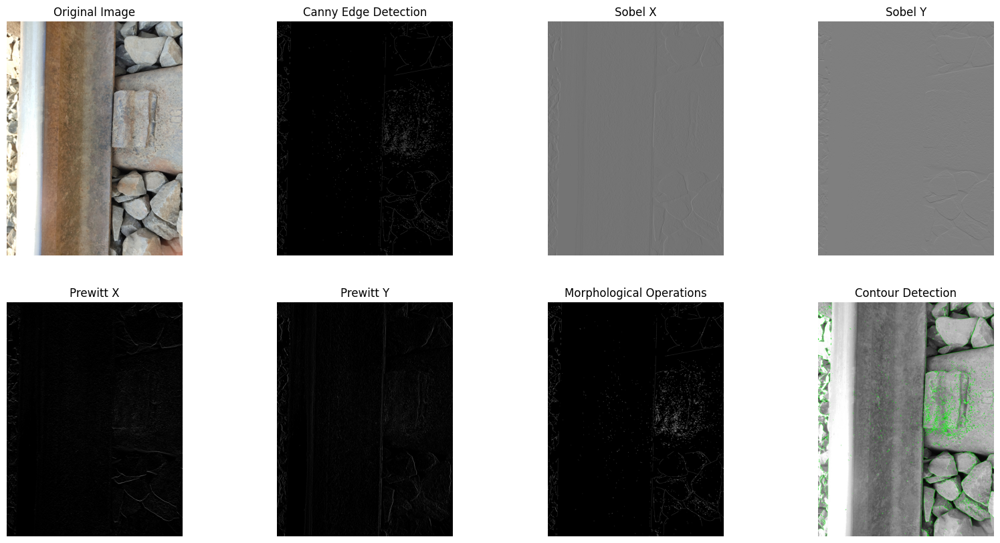

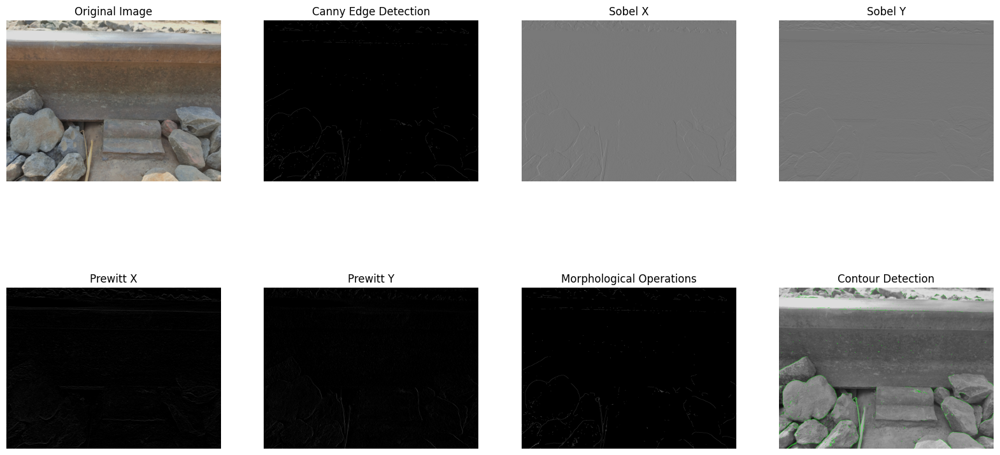

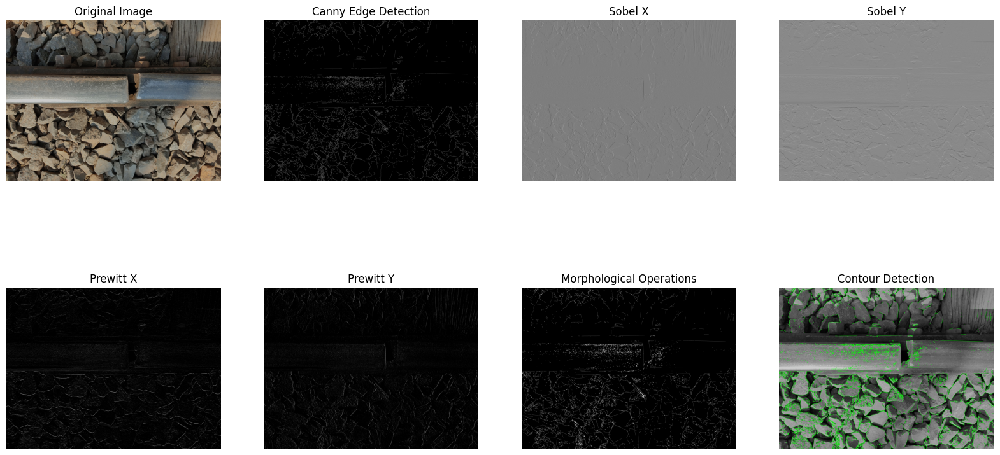

In [9]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random
from skimage.feature import hog

# Dataset path
augmented_path = "/kaggle/working/Defective_Augmented"

# Create a directory to save processed images
processed_path = "/kaggle/working/Defective_Features"
os.makedirs(processed_path, exist_ok=True)

# List all augmented image files
image_files = [file for file in os.listdir(augmented_path) if file.endswith(('.png', '.jpg', '.jpeg'))]

def extract_features(img):
    """Apply edge detection, morphological operations, histogram equalization, and contour detection."""
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Edge Detection (Canny, Sobel, Prewitt)
    edges_canny = cv2.Canny(gray, 100, 200)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    prewittx = cv2.filter2D(gray, -1, np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]]))
    prewitty = cv2.filter2D(gray, -1, np.array([[1, 0, -1], [1, 0, -1], [1, 0, -1]]))
    
    # Morphological Operations
    kernel = np.ones((3, 3), np.uint8)
    morph = cv2.morphologyEx(edges_canny, cv2.MORPH_CLOSE, kernel)
    
    # Histogram Equalization
    hist_eq = cv2.equalizeHist(gray)
    
    # Contour Detection
    contours, _ = cv2.findContours(edges_canny, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contour_img = cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR)
    cv2.drawContours(contour_img, contours, -1, (0, 255, 0), 2)
    
    return edges_canny, sobelx, sobely, prewittx, prewitty, morph, hist_eq, contour_img

# Process images and save features
for img_file in image_files:
    img_path = os.path.join(augmented_path, img_file)
    img = cv2.imread(img_path)
    
    edges_canny, sobelx, sobely, prewittx, prewitty, morph, hist_eq, contour_img = extract_features(img)
    
    # Save processed images
    cv2.imwrite(os.path.join(processed_path, f"edges_canny_{img_file}"), edges_canny)
    cv2.imwrite(os.path.join(processed_path, f"sobelx_{img_file}"), sobelx.astype(np.uint8))
    cv2.imwrite(os.path.join(processed_path, f"sobely_{img_file}"), sobely.astype(np.uint8))
    cv2.imwrite(os.path.join(processed_path, f"prewittx_{img_file}"), prewittx.astype(np.uint8))
    cv2.imwrite(os.path.join(processed_path, f"prewitty_{img_file}"), prewitty.astype(np.uint8))
    cv2.imwrite(os.path.join(processed_path, f"morph_{img_file}"), morph)
    cv2.imwrite(os.path.join(processed_path, f"hist_eq_{img_file}"), hist_eq)
    cv2.imwrite(os.path.join(processed_path, f"contour_{img_file}"), contour_img)
    
    # Display original and processed images (for the first 3 images)
    if image_files.index(img_file) < 3:
        plt.figure(figsize=(20, 10))

        plt.subplot(2, 4, 1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, 4, 2)
        plt.imshow(edges_canny, cmap='gray')
        plt.title("Canny Edge Detection")
        plt.axis('off')

        plt.subplot(2, 4, 3)
        plt.imshow(sobelx, cmap='gray')
        plt.title("Sobel X")
        plt.axis('off')

        plt.subplot(2, 4, 4)
        plt.imshow(sobely, cmap='gray')
        plt.title("Sobel Y")
        plt.axis('off')

        plt.subplot(2, 4, 5)
        plt.imshow(prewittx, cmap='gray')
        plt.title("Prewitt X")
        plt.axis('off')

        plt.subplot(2, 4, 6)
        plt.imshow(prewitty, cmap='gray')
        plt.title("Prewitt Y")
        plt.axis('off')

        plt.subplot(2, 4, 7)
        plt.imshow(morph, cmap='gray')
        plt.title("Morphological Operations")
        plt.axis('off')

        plt.subplot(2, 4, 8)
        plt.imshow(contour_img)
        plt.title("Contour Detection")
        plt.axis('off')

        plt.show()


# **TRANSFER LEARNING FROM HERE TO CLASSIFY IMAGES INTO DEFECTIVE AND NOT DEFECTIVE# **

In [10]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50


# imported ResNet50 model.
# FREEZING its initial layers
# adding TWO custom layers according to our dataset

In [11]:
# Load ResNet50 without the top layer
base_model = ResNet50(weights="imagenet", include_top=False, input_shape=(224, 224, 3))

# Freeze initial layers
for layer in base_model.layers:
    layer.trainable = False

# Add custom layers
x = GlobalAveragePooling2D()(base_model.output)  # Flatten feature maps
x = Dense(128, activation='relu')(x)  # Fully connected layer
x = Dense(2, activation='softmax')(x)  # Output layer for 2 classes

# Create final model
model = Model(inputs=base_model.input, outputs=x)


I0000 00:00:1745437402.934900      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


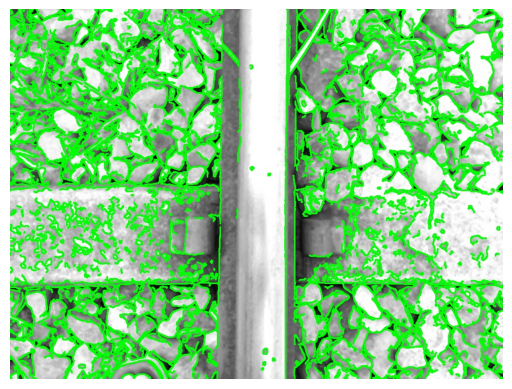

In [12]:
import matplotlib.pyplot as plt
import cv2

# Load and display the image
image_path = "/kaggle/working/Defective_Features/contour_aug_131051004_382613492830631_1306891331783850055_n.jpg"
img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for correct colors

plt.imshow(img)
plt.axis("off")  # Hide axes
plt.show()


Found 299 images belonging to 2 classes.
Found 62 images belonging to 2 classes.
234545216/234545216 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 448, 448, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 454, 454, 3)    │              0 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 224, 224, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 226, 226, 64)   │              0 │ conv1_conv[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 112, 112, 64)   │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_preact_bn    │ (None, 112, 112, 64)   │            256 │ pool1_pool[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_preact_relu  │ (None, 112, 112, 64)   │              0 │ conv2_block1_preact_b… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 112, 112, 64)   │          4,096 │ conv2_block1_preact_r… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 112, 112, 64)   │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 112, 112, 64)   │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_pad        │ (None, 114, 114, 64)   │              0 │ conv2_block1_1_relu[0… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 112, 112, 64)   │         36,864 │ conv2_block1_2_pad[0]… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 112, 112, 64)   │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 112, 112, 64)   │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv  

 Total params: 58,602,241 (223.55 MB)

 Trainable params: 270,593 (1.03 MB)

 Non-trainable params: 58,331,648 (222.52 MB)

Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1745437495.035084      98 service.cc:148] XLA service 0x7b5dfc002290 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1745437495.035957      98 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1745437499.116373      98 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1745437509.261790      98 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


10/10 ━━━━━━━━━━━━━━━━━━━━ 135s 5s/step - accuracy: 0.5545 - loss: 0.7025 - val_accuracy: 0.8387 - val_loss: 0.5485
Epoch 2/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.6683 - loss: 0.5904 - val_accuracy: 0.8871 - val_loss: 0.4407
Epoch 3/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 53s 2s/step - accuracy: 0.7333 - loss: 0.5237 - val_accuracy: 0.8548 - val_loss: 0.4084
Epoch 4/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 61s 2s/step - accuracy: 0.7743 - loss: 0.4857 - val_accuracy: 0.8548 - val_loss: 0.3895
Epoch 5/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 59s 2s/step - accuracy: 0.7787 - loss: 0.4418 - val_accuracy: 0.8548 - val_loss: 0.3795
Epoch 6/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 57s 2s/step - accuracy: 0.7960 - loss: 0.4243 - val_accuracy: 0.8548 - val_loss: 0.3375
Epoch 7/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 57s 2s/step - accuracy: 0.8255 - loss: 0.3669 - val_accuracy: 0.8871 - val_loss: 0.3309
Epoch 8/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 61s 2s/step - accuracy: 0.8824 - loss: 0.3121 - val_accuracy: 0.8710 - val_loss: 0.3365
Ep

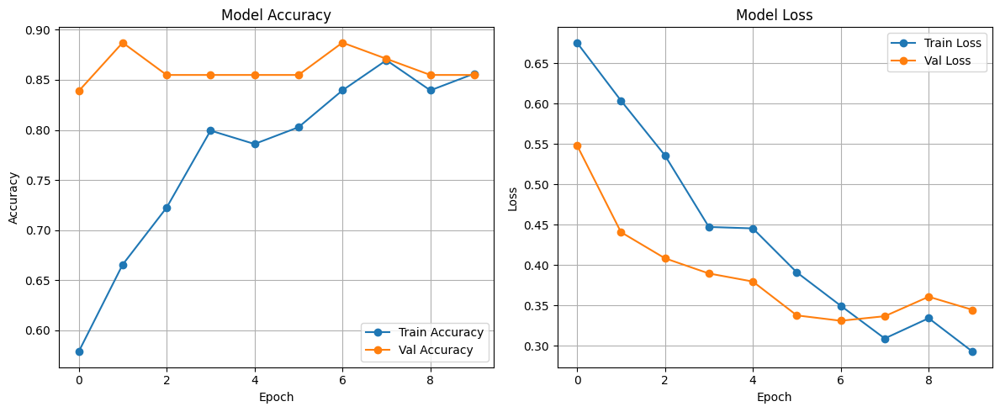

In [13]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet152V2
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Input, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define Paths
train_dir = "/kaggle/input/railway-track-fault-detection/Railway Track fault Detection Updated/Train"
val_dir = "/kaggle/input/railway-track-fault-detection/Railway Track fault Detection Updated/Validation"
test_dir = "/kaggle/input/railway-track-fault-detection/Railway Track fault Detection Updated/Test"

# Image Data Generator (Rescale + Augment)
train_datagen = ImageDataGenerator(rescale=1./255,
                                   rotation_range=20,
                                   zoom_range=0.2,
                                   horizontal_flip=True)

val_datagen = ImageDataGenerator(rescale=1./255)

# Load Images
train_data = train_datagen.flow_from_directory(train_dir, target_size=(448, 448), batch_size=32, class_mode="binary")
val_data = val_datagen.flow_from_directory(val_dir, target_size=(448, 448), batch_size=32, class_mode="binary")

# Load Pretrained ResNet152V2 as Feature Extractor
base_model = ResNet152V2(input_shape=(448, 448, 3), weights='imagenet', include_top=False)
base_model.trainable = False  # Freeze base model layers

# Add Custom Layers
x = base_model.output
x = GlobalAveragePooling2D()(x)  # Reduce dimensions
x = Dense(128, activation="relu")(x)
x = Dropout(0.3)(x)  # Prevent Overfitting
x = Dense(64, activation="relu")(x)
x = Dropout(0.3)(x)
y = Dense(1, activation="sigmoid")(x)  # Binary Classification (Defective / Non-Defective)

# Create Model
model = Model(inputs=base_model.input, outputs=y)

# Compile Model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              loss="binary_crossentropy",
              metrics=["accuracy"])

# Model Summary
model.summary()

# Train Model
history = model.fit(train_data, validation_data=val_data, epochs=10)

# --- Plot Accuracy ---
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 5))

# Accuracy Plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy', marker='o')
plt.plot(history.history['val_accuracy'], label='Val Accuracy', marker='o')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss Plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss', marker='o')
plt.plot(history.history['val_loss'], label='Val Loss', marker='o')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.savefig('resnet152v2_training_performance.png')  # Save the plot
plt.show()



In [14]:
test_data = val_datagen.flow_from_directory(test_dir, target_size=(448, 448), batch_size=32, class_mode="binary")
model.evaluate(test_data)


Found 22 images belonging to 2 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step - accuracy: 0.8636 - loss: 0.4256


[0.425563782453537, 0.8636363744735718]

In [15]:
import numpy as np
from tensorflow.keras.preprocessing import image

def predict(image_path, model):
    img = image.load_img(image_path, target_size=(448, 448))
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension

    prediction = model.predict(img_array)
    return "Defective" if prediction[0] > 0.5 else "Non-Defective"

print(predict("/kaggle/input/railway-track-fault-detection/Railway Track fault Detection Updated/Test/Non defective/IMG_20201114_100023.jpg", model))


1/1 ━━━━━━━━━━━━━━━━━━━━ 12s 12s/step
Defective


# INCEPTION NET TRAINING

Found 299 images belonging to 2 classes.
Found 62 images belonging to 2 classes.
Epoch 1/10
19/19 ━━━━━━━━━━━━━━━━━━━━ 82s 3s/step - accuracy: 0.4922 - loss: 0.8789 - val_accuracy: 0.7419 - val_loss: 0.5946
Epoch 2/10
19/19 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.6706 - loss: 0.6153 - val_accuracy: 0.7258 - val_loss: 0.5533
Epoch 3/10
19/19 ━━━━━━━━━━━━━━━━━━━━ 44s 2s/step - accuracy: 0.6157 - loss: 0.6338 - val_accuracy: 0.7742 - val_loss: 0.5500
Epoch 4/10
19/19 ━━━━━━━━━━━━━━━━━━━━ 43s 1s/step - accuracy: 0.7066 - loss: 0.5610 - val_accuracy: 0.6774 - val_loss: 0.5606
Epoch 5/10
19/19 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.7186 - loss: 0.5640 - val_accuracy: 0.7903 - val_loss: 0.4879
Epoch 6/10
19/19 ━━━━━━━━━━━━━━━━━━━━ 44s 2s/step - accuracy: 0.7634 - loss: 0.4721 - val_accuracy: 0.7742 - val_loss: 0.4959
Epoch 7/10
19/19 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.7583 - loss: 0.4794 - val_accuracy: 0.7419 - val_loss: 0.5152
Epoch 8/10
19/19 ━━━━━━━━━━━━━━━━━━━━

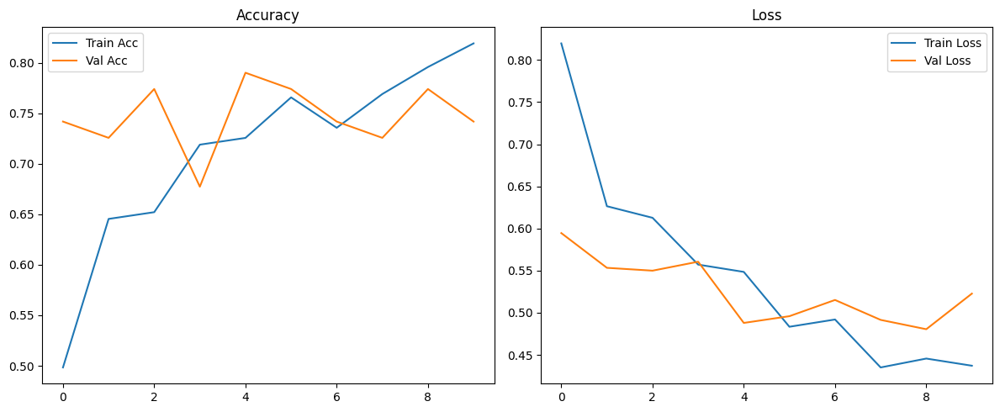

In [17]:

from tensorflow.keras.applications import InceptionV3


# Define paths
train_dir = "/kaggle/input/railway-track-fault-detection/Railway Track fault Detection Updated/Train"
val_dir = "/kaggle/input/railway-track-fault-detection/Railway Track fault Detection Updated/Validation"

# ImageDataGenerator with augmentation
train_datagen = ImageDataGenerator(rescale=1./255,
                                   rotation_range=20,
                                   zoom_range=0.2,
                                   horizontal_flip=True)

val_datagen = ImageDataGenerator(rescale=1./255)

train_data = train_datagen.flow_from_directory(train_dir, target_size=(299, 299), batch_size=16, class_mode='binary')
val_data = val_datagen.flow_from_directory(val_dir, target_size=(299, 299), batch_size=16, class_mode='binary')

# Load base model
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(299, 299, 3))
base_model.trainable = False  # Freeze base model

# Add custom head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.3)(x)
x = Dense(64, activation='relu')(x)
x = Dropout(0.3)(x)
output = Dense(1, activation='sigmoid')(x)

model = Model(inputs=base_model.input, outputs=output)

# Compile
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Train
history = model.fit(train_data, validation_data=val_data, epochs=10)

# Plot performance graphs
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(history.history['accuracy'], label='Train Acc')
plt.plot(history.history['val_accuracy'], label='Val Acc')
plt.title('Accuracy')
plt.legend()

plt.subplot(1,2,2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Loss')
plt.legend()
plt.tight_layout()
plt.show()
